<a href="https://colab.research.google.com/github/KuproyMalang/PCVK_Genap_2023/blob/main/Week6.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
import numpy as np
import cv2 as cv
from google.colab.patches import cv2_imshow
import matplotlib.pyplot as plt
from skimage import io
import math
import os
import glob

<BarContainer object of 256 artists>

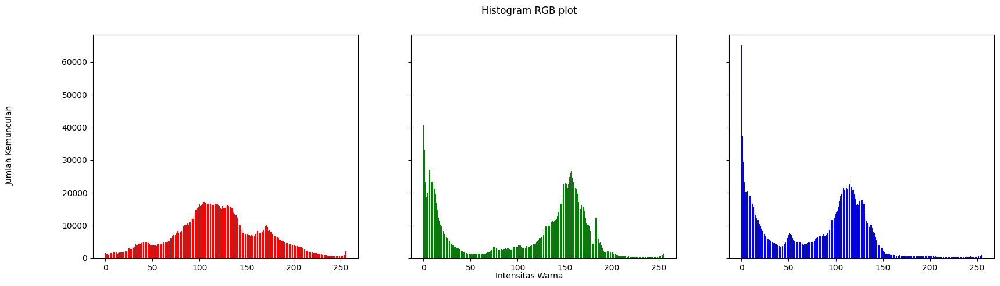

In [3]:
img = cv.imread('/content/drive/MyDrive/Flower.JPG')
height, width, depth = np.shape(img)
names = np.arange(256)

blue = [0]*256
green = [0]*256
red = [0]*256

for y in range(0,height):
  for x in range(0,width):
    blue[img[y][x][0]] += 1
    green[img[y][x][1]] += 1
    red[img[y][x][2]] += 1

names = np.arange(256)
fig, axs = plt.subplots(1, 3, figsize=[20,5], sharex=True, sharey=True)
fig.suptitle('Histogram RGB plot')
fig.text(0.05, 0.5, 'Jumlah Kemunculan', va='center', rotation='vertical')
fig.text(0.5, 0.04, 'Intensitas Warna', ha='center')
axs[0].bar(names, red, color='red')
axs[1].bar(names, green, color='green')
axs[2].bar(names, blue, color='blue')
     

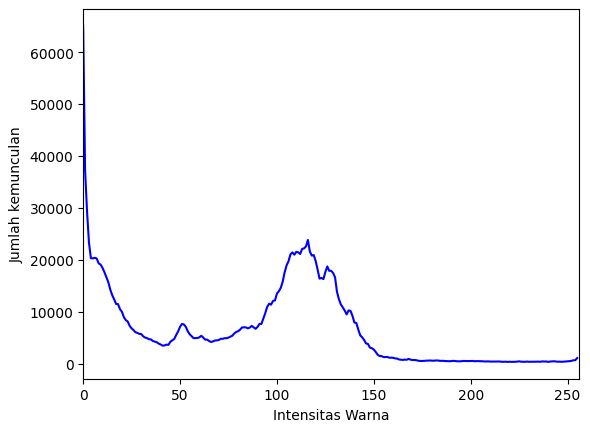

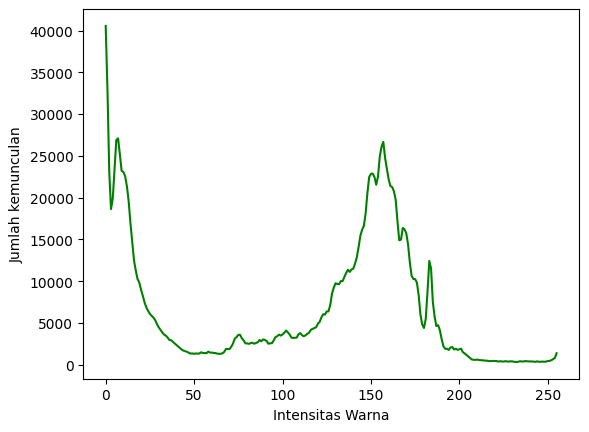

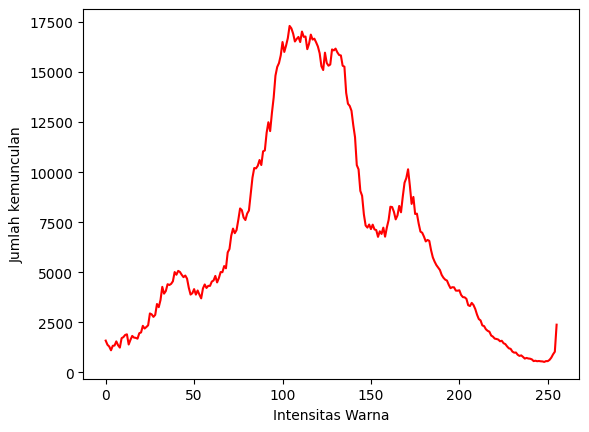

In [4]:
img = cv.imread('/content/drive/MyDrive/Flower.JPG')
colors = ("b","g","r")
channel_ids = (0, 1, 2)

# Membuat Histogram Plot
plt.xlim([0, 256])
for channel_id, c in zip(channel_ids, colors):
  histogram, bin_edges = np.histogram(
      img[:, :, channel_id], bins=256, range =(0,256)
  )
  plt.plot(bin_edges[0:-1], histogram, color=c)

  plt.xlabel("Intensitas Warna")
  plt.ylabel("Jumlah kemunculan")

  plt.show()
     

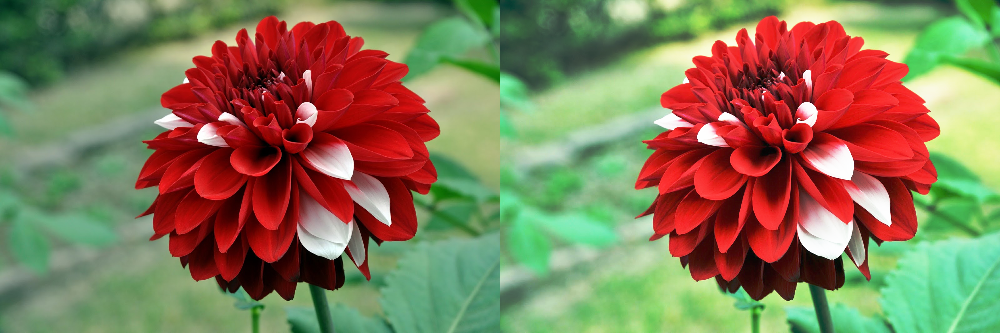

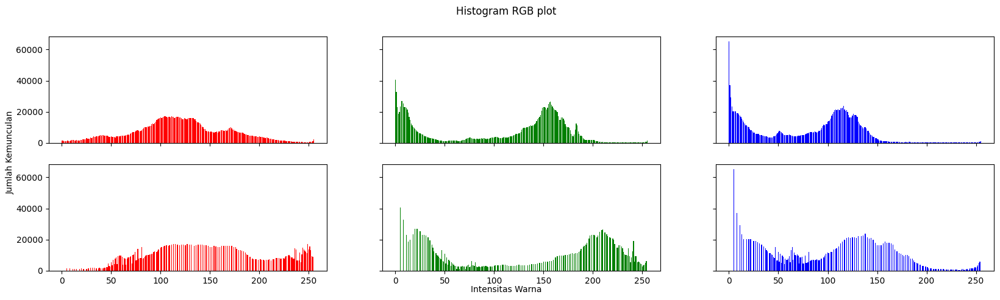

In [5]:
img = cv.imread('/content/drive/MyDrive/Flower.JPG')
def histog(img):
  height, width, depth = np.shape(img) 
  ax = np.zeros((3,256)) 
  for y in range(0,height) : 
    for x in range(0,width) :
      ax[0][img[y][x][0]] += 1 
      ax[1][img[y][x][1]] += 1
      ax[2][img[y][x][2]] += 1 
  return ax

histo_asli = histog(img)

# convert to Numpy array 
img_array = np.asarray(img)

# STEP 1: Normalized cumulative histogram
# flatten image array and calculate histogram via binning 
histogram_array = np.bincount(img_array.flatten(), minlength=256)

# normalize 
num_pixels = np. sum(histogram_array) 
histogram_array = histogram_array/num_pixels

# normalized cumulative histogram 
chistogram_array = np.cumsum(histogram_array)

# STEP 2: Pixel mapping lookup table
transform_map = np.floor(255 * chistogram_array). astype (np.uint8)

# STEP 3: Transformation
# flatten image array into 10 list 
img_list = list(img_array.flatten())

# transform pixel values to equalize 
eq_img_list = [transform_map[p] for p in img_list]

# reshape and write back into img_array 
eq_img_array = np.reshape(np.asarray(eq_img_list), img_array.shape) 
img2 = eq_img_array

equal_histo = histog(img2)

final_frame = cv.hconcat((img, img2)) #concatenate image
cv2_imshow(final_frame)

names = np.arange (256) 
isgrayimg = np.array_equal(blue, green, red) 
if (isgrayimg == False):
  fig, axs = plt.subplots(2, 3, figsize=[20,5], sharex=True, sharey=True) 
  fig.suptitle('Histogram RGB plot') 
  fig.text(0.09, 0.5, 'Jumlah Kemunculan', va='center', rotation='vertical') 
  fig.text(0.5, 0.04, 'Intensitas Warna', ha='center') 
  axs[0,0].bar(names, histo_asli[2], color='red') 
  axs[0,1].bar(names, histo_asli[1], color='green') 
  axs[0,2].bar(names, histo_asli[0], color='blue') 
  axs[1,0].bar(names, equal_histo[2], color='red') 
  axs[1,1].bar(names, equal_histo[1], color='green')
  axs[1,2].bar(names, equal_histo[0], color='blue') 
else:
  fig, axs = plt. subplots(1, 2, figsize=[20,5], sharex=True, sharey=True) 
  fig. suptitle('Histogram RGB plot') 
  fig.text(0.09, 0.5, 'Jumlah Kemunculan', va='center', rotation='vertical') 
  fig.text(0.5, 0.94, 'Intensitas Warna', ha='center') 
  axs[0,0].bar(names, histo_asli[2], color='gray') 
  axs[0,1].bar(names, equal_histo[2], color='gray')

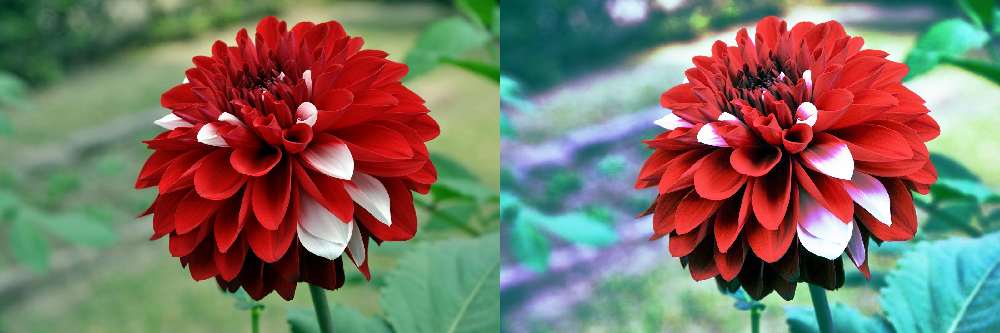

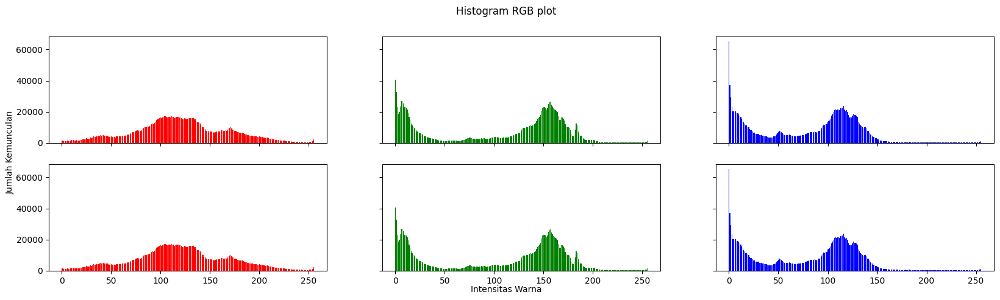

In [6]:
img = cv.imread('/content/drive/MyDrive/Flower.JPG')
channels = cv.split(img)
eq_channels = []
for ch, color in zip(channels, ['R', 'G', 'B']):
  eq_channels.append(cv.equalizeHist(ch))
eq_image = cv.merge(eq_channels)
equal_histo = histog(eq_image)

final_frame = cv.hconcat((img, eq_image))
cv2_imshow(final_frame)

names = np.arange(256)
isgraying = np.array_equal(blue, green, red)
if (isgraying == False):
  fig, axs = plt.subplots(2, 3, figsize=[20,5], sharex=True, sharey =True)
  fig.suptitle('Histogram RGB plot')
  fig.text(0.09, 0.5, 'Jumlah Kemunculan', va='center', rotation='vertical')
  fig.text(0.5, 0.04, 'Intensitas Warna', ha='center')
  axs[0,0].bar(names, histo_asli[2], color='red')
  axs[0,1].bar(names, histo_asli[1], color='green')
  axs[0,2].bar(names, histo_asli[0], color='blue')
  axs[1,0].bar(names, histo_asli[2], color='red')
  axs[1,1].bar(names, histo_asli[1], color='green')
  axs[1,2].bar(names, histo_asli[0], color='blue')
else:
  fig, axs = plt.subplots(1, 2, figsize=[20,5], sharex=True, sharey=True)
  fig.suptitle('Histogram RGB plot')
  fig.text(0.09, 0.5, 'Jumlah Kemunculan', va='center', rotation='vertical')
  fig.text(0.5, 0.04, 'Intensitas Warna', ha='center')
  axs[0,0].bar(names, histo_asli[2], color='gray')
  axs[0,1].bar(names, equal_histo[2], color='gray')

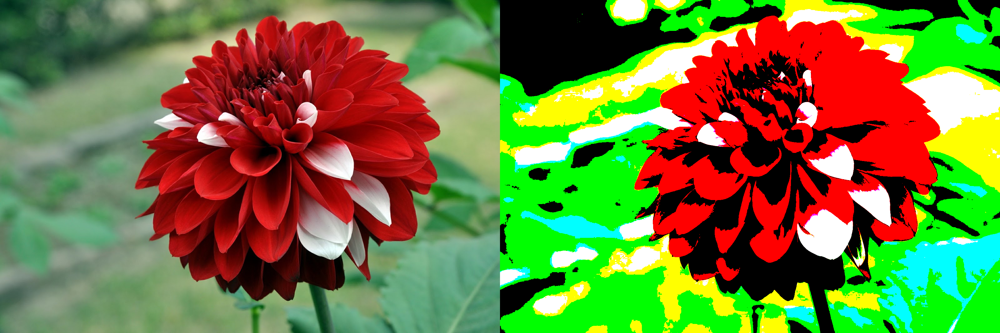

-1

In [8]:
img = cv.imread('/content/drive/MyDrive/Flower.JPG')

def warnaTerdekat(r, g, b):
    pValue = 0
    minDistance = 255 * 255 + 255 * 255 + 255 * 255 + 1
    warnaPallette = [[0, 0, 0], [255, 0, 0], [0, 255, 0], [255, 255, 0], [0, 0, 255], [255, 0, 255], [0, 255, 255], [255, 255, 255]]
    for i in range(len(warnaPallette)):
        rDiff = r - warnaPallette[i][0]
        gDiff = g - warnaPallette[i][1]
        bDiff = b - warnaPallette[i][2]
        distance = rDiff * rDiff + gDiff * gDiff + bDiff * bDiff
        if (distance < minDistance):
            minDistance = distance
            pValue = i
    return pValue

warnaPallette = [[0, 0, 0], [255, 0, 0], [0, 255, 0], [255, 255, 0], [0, 0, 255], [255, 0, 255], [0, 255, 255], [255, 255, 255]]
img_16 = cv.cvtColor(img, cv.COLOR_BGR2RGB)
img_8 = np.zeros(img_16.shape, img_16.dtype)

for y in range(img_16.shape[0]):
    for x in range(img_16.shape[1]):
        baru = warnaTerdekat(img_16[y, x, 0], img_16[y, x, 1], img_16[y, x, 2])
        img_8[y, x] = warnaPallette[baru]

img_16 = cv.cvtColor(img_16, cv.COLOR_BGR2RGB)
img_8 = cv.cvtColor(img_8, cv.COLOR_BGR2RGB)
final_frame = cv.hconcat((img_16, img_8))

cv2_imshow(final_frame)
cv.imwrite('/content/drive/MyDrive/Flower2.JPG', img_8)
cv.waitKey(0)

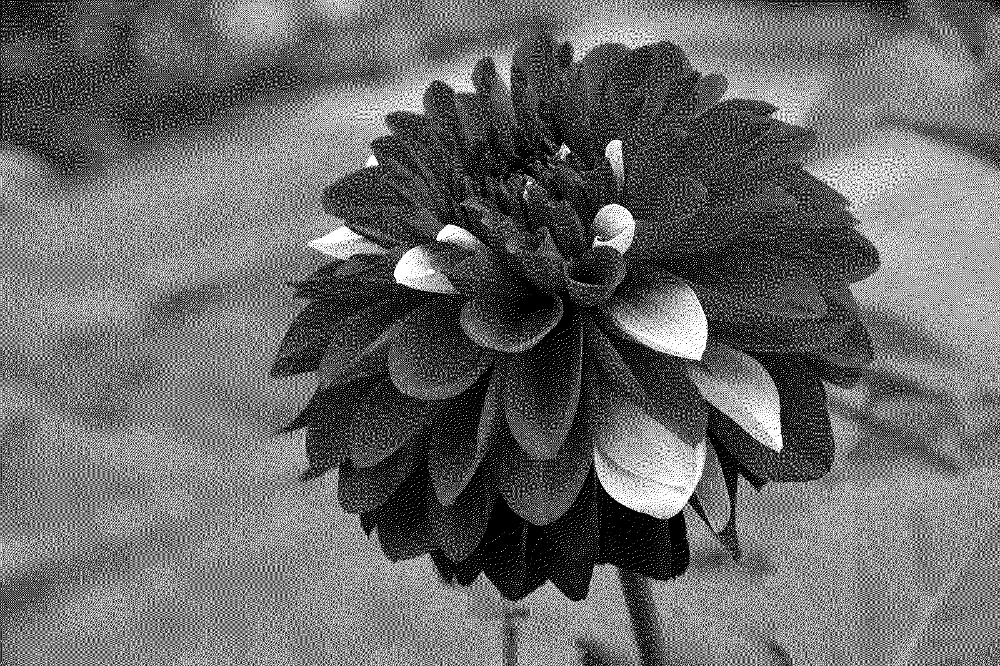

In [10]:
from PIL import Image
import cv2

imageConvert = Image.open('/content/drive/MyDrive/Flower.JPG').convert(mode='1', dither=Image.FLOYDSTEINBERG)
imageConvert.save('/content/drive/MyDrive/Flower2.JPG')

image = cv2.imread('/content/drive/MyDrive/Flower2.JPG')

grayImage = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

height = grayImage.shape[0]
width = grayImage.shape[1]

for y in range(0, height-1):
    for x in range(1, width-1):

        old_value = grayImage[y, x]
        new_value = 0
        if (old_value > 128) :
            new_value = 255

        grayImage[y, x] = new_value

        error = old_value - new_value

        if (x < width - 1):
            new_number = grayImage[y, x+1] + error * 7 / 16
            if (new_number > 255) : new_number = 255
            elif (new_number < 0) : new_number = 0
            grayImage[y, x+1] = new_number

        if (x > 0 and y < height - 1):
            new_number = grayImage[y+1, x-1] + error * 3 / 16
            if (new_number > 255) : new_number = 255
            elif (new_number < 0) : new_number = 0
            grayImage[y+1, x-1] = new_number

        if (y < height - 1):
            new_number = grayImage[y+1, x] + error * 5 / 16
            if (new_number > 255) : new_number = 255
            elif (new_number < 0) : new_number = 0
            grayImage[y+1, x] = new_number

        if (y < height - 1 and x < width - 1):
            new_number = grayImage[y+1, x+1] + error * 1 / 16
            if (new_number > 255) : new_number = 255
            elif (new_number < 0) : new_number = 0
            grayImage[y+1, x+1] = new_number

cv2.imwrite('/content/drive/MyDrive/Flower_dithered.JPG', grayImage)
cv2_imshow(grayImage)